In [62]:
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision
import torchvision.transforms as transforms

import numpy as np
import matplotlib.pyplot as plt

from sklearn.manifold import TSNE
import pandas as pd

from pylab imp

%matplotlib inline

In [63]:
# Hyperparameters
cuda = True
epochs = 20
log_interval = 400
batchSize = 16

hidden_layer_size_1 = 256
hidden_layer_size_2 = 256
hidden_layer_size_3 = 256

lr = 0.001

In [64]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(3 * 32 * 32, hidden_layer_size_1)
        self.fc2 = nn.Linear(hidden_layer_size_1, hidden_layer_size_2)
        self.fc3 = nn.Linear(hidden_layer_size_2, hidden_layer_size_3)
        self.fc4 = nn.Linear(hidden_layer_size_3, 10)

    def forward(self, x):
        x = x.view(-1, 3 * 32 * 32)
        activation_1 = F.relu(self.fc1(x))
        activation_2 = F.relu(self.fc2(activation_1))
        activation_3 = F.relu(self.fc3(activation_2))
        x = self.fc4(activation_3)
        return x, torch.sign(activation_3)
    
model = Net()
print(model)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)

Net (
  (fc1): Linear (3072 -> 256)
  (fc2): Linear (256 -> 256)
  (fc3): Linear (256 -> 256)
  (fc4): Linear (256 -> 10)
)


In [65]:
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batchSize,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=batchSize,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified
Files already downloaded and verified


In [66]:
if cuda:
    model.cuda()
    criterion.cuda()

In [67]:
def train(epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(trainloader):
        if cuda:
            data, target = data.cuda(), target.cuda()
        data, target = Variable(data), Variable(target)
        optimizer.zero_grad()
        output, activations = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        if batch_idx % log_interval == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(trainloader.dataset),
                100. * batch_idx / len(trainloader), loss.data[0]))

def test(epoch):
    model.eval()
    test_loss = 0
    correct = 0
    for data, target in testloader:
        if cuda:
            data, target = data.cuda(), target.cuda()
        data, target = Variable(data, volatile=True), Variable(target)
        output, activations = model(data)
        test_loss += criterion(output, target).data[0]
        pred = output.data.max(1)[1] # get the index of the max log-probability
        correct += pred.eq(target.data).cpu().sum()

    test_loss = test_loss
    test_loss /= len(testloader) # loss function already averages over batch size
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(testloader.dataset),
        100. * correct / len(testloader.dataset)))
    
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=(20, 20 * 11 / batchSize))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()
    
def nearest_neighbours_plot():
    SelectedImages = 0
    SelectedActivations = 0
    BestImages = torch.FloatTensor(batchSize, 11, 3, 32, 32).cuda()
    Distances = np.zeros([batchSize, 10])
    Distances.fill(np.inf)
    
    for batch_idx, (data, target) in enumerate(trainloader):
        if cuda:
            data, target = data.cuda(), target.cuda()
        dataVar, target = Variable(data), Variable(target)
        output, activations = model(dataVar)
        if batch_idx == 0:
            SelectedImages = data
            SelectedActivations = activations
        else:
            for SelecIndex in range(SelectedImages.size(0)):    
                for potentialNeighbour in range(activations.size(0)):
                    currentDistance = torch.abs(activations[potentialNeighbour] - SelectedActivations[SelecIndex]).sum().cpu().data.numpy()[0]
                    if currentDistance < Distances[SelecIndex].max():
                        # Update everything
                        for position in range(10):
                            if currentDistance < Distances[SelecIndex, position]:
                                Distances[SelecIndex, position:] = np.append(currentDistance, Distances[SelecIndex, position:9])
                                if position == 9:
                                    BestImages[SelecIndex, position] = data[potentialNeighbour].unsqueeze(0)
                                else:
                                    BestImages[SelecIndex, position:] = torch.cat((data[potentialNeighbour].unsqueeze(0), BestImages[SelecIndex, position:10]))
                                break
                                    
            
            if batch_idx == 500:
                break
    for SelecIndex in range(SelectedImages.size(0)):
        BestImages[SelecIndex] = torch.cat((SelectedImages[SelecIndex].unsqueeze(0), BestImages[SelecIndex, :10]), 0)
    BestImages.resize_(batchSize * 11, 3, 32, 32)
    imshow(torchvision.utils.make_grid(BestImages.cpu(), nrow=11))
    print(Distances)

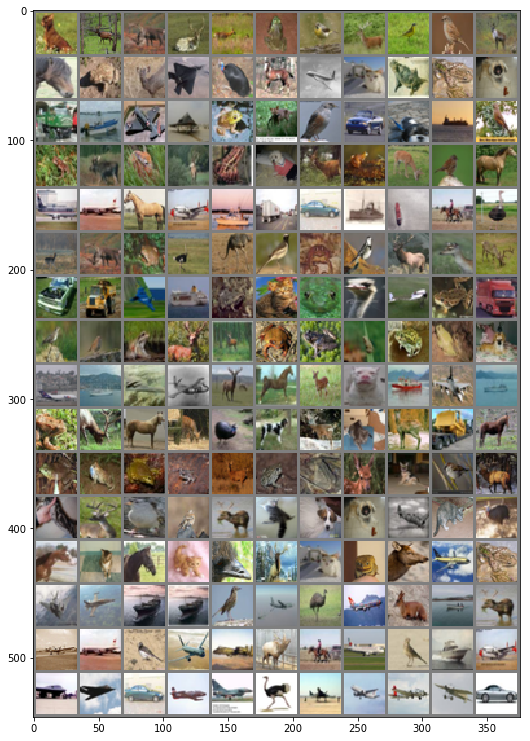

[[ 22.  22.  23.  23.  24.  25.  25.  28.  28.  28.]
 [ 29.  29.  29.  30.  31.  31.  31.  32.  32.  33.]
 [ 36.  38.  38.  38.  38.  39.  39.  40.  40.  40.]
 [ 24.  28.  28.  29.  29.  29.  29.  29.  29.  29.]
 [ 26.  27.  28.  30.  30.  31.  31.  31.  31.  32.]
 [ 21.  21.  23.  23.  24.  24.  24.  25.  25.  25.]
 [ 31.  33.  35.  36.  36.  36.  38.  38.  38.  39.]
 [ 33.  34.  34.  34.  35.  35.  35.  36.  36.  36.]
 [ 32.  32.  33.  34.  35.  35.  35.  35.  35.  36.]
 [ 36.  40.  40.  41.  41.  41.  42.  42.  42.  42.]
 [ 21.  25.  25.  25.  26.  27.  27.  27.  27.  27.]
 [ 32.  34.  34.  34.  34.  34.  35.  35.  35.  35.]
 [ 33.  33.  34.  34.  34.  34.  34.  35.  35.  35.]
 [ 28.  28.  28.  29.  29.  29.  30.  31.  31.  31.]
 [ 23.  26.  27.  27.  29.  30.  30.  30.  31.  31.]
 [ 31.  33.  33.  35.  35.  36.  36.  37.  37.  38.]]
Train Epoch: 1 [0/50000 (0%)]	Loss: 2.312901
Train Epoch: 1 [6400/50000 (13%)]	Loss: 2.122792
Train Epoch: 1 [12800/50000 (26%)]	Loss: 2.033118
Train E

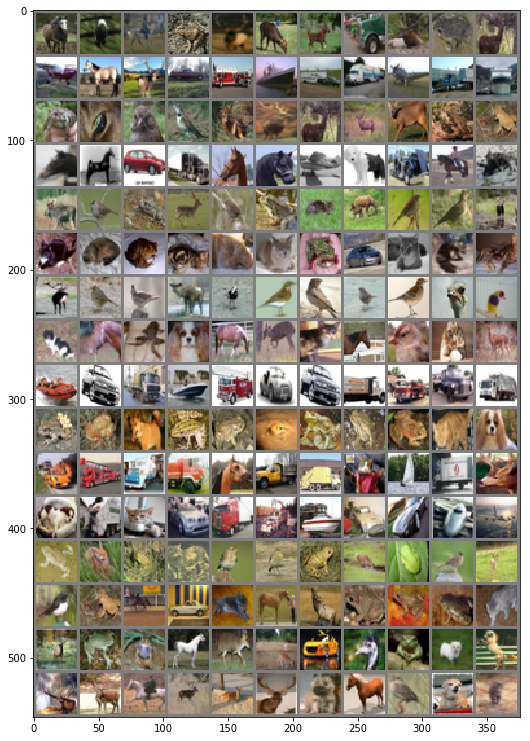

[[  6.   6.   9.   9.   9.  11.  11.  11.  11.  12.]
 [  8.   9.   9.  10.  12.  12.  12.  13.  13.  14.]
 [ 13.  15.  15.  17.  17.  18.  18.  18.  18.  18.]
 [ 19.  20.  20.  20.  20.  21.  21.  21.  21.  21.]
 [ 11.  12.  12.  13.  13.  14.  14.  14.  15.  15.]
 [ 18.  19.  21.  22.  22.  22.  22.  23.  23.  24.]
 [ 18.  19.  19.  20.  20.  20.  21.  21.  22.  22.]
 [ 21.  22.  23.  23.  24.  24.  24.  24.  25.  25.]
 [ 15.  16.  19.  19.  19.  20.  20.  20.  21.  21.]
 [ 11.  11.  12.  12.  12.  13.  13.  13.  13.  13.]
 [ 19.  19.  19.  20.  21.  22.  22.  22.  23.  23.]
 [ 12.  14.  14.  14.  14.  15.  15.  15.  15.  16.]
 [  6.   7.   7.   8.   9.   9.   9.   9.   9.   9.]
 [  9.   9.  10.  10.  10.  11.  11.  11.  11.  11.]
 [  9.  10.  11.  11.  11.  11.  12.  12.  12.  12.]
 [ 20.  23.  23.  23.  24.  24.  24.  25.  25.  25.]]
Train Epoch: 2 [0/50000 (0%)]	Loss: 2.059909
Train Epoch: 2 [6400/50000 (13%)]	Loss: 1.455096
Train Epoch: 2 [12800/50000 (26%)]	Loss: 1.433599
Train E

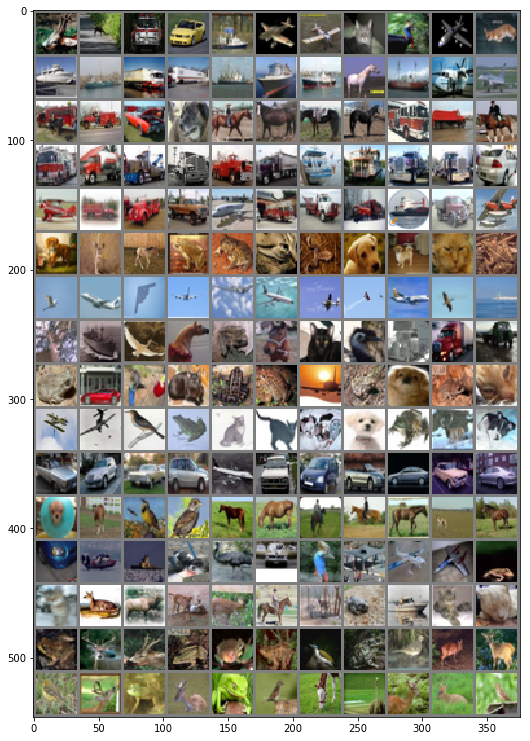

[[ 17.  22.  23.  23.  24.  24.  24.  24.  25.  25.]
 [ 18.  19.  20.  21.  21.  22.  22.  23.  23.  23.]
 [ 26.  26.  27.  27.  29.  29.  29.  30.  31.  31.]
 [ 13.  13.  18.  18.  18.  19.  19.  20.  21.  21.]
 [ 21.  23.  24.  24.  26.  27.  28.  28.  28.  29.]
 [ 13.  16.  17.  18.  18.  18.  18.  19.  19.  19.]
 [ 12.  12.  13.  14.  14.  14.  15.  15.  15.  15.]
 [ 19.  20.  20.  20.  21.  21.  21.  22.  23.  23.]
 [ 19.  22.  24.  24.  25.  25.  25.  25.  26.  26.]
 [ 16.  21.  23.  24.  25.  25.  25.  26.  27.  27.]
 [ 18.  19.  19.  21.  21.  21.  22.  22.  22.  23.]
 [ 22.  23.  24.  25.  26.  26.  26.  27.  28.  29.]
 [ 25.  26.  27.  30.  31.  31.  32.  33.  33.  33.]
 [ 22.  23.  24.  24.  25.  25.  27.  27.  28.  28.]
 [ 13.  13.  13.  14.  14.  14.  14.  15.  15.  15.]
 [ 21.  24.  24.  24.  26.  27.  27.  28.  28.  28.]]
Train Epoch: 3 [0/50000 (0%)]	Loss: 1.139572
Train Epoch: 3 [6400/50000 (13%)]	Loss: 1.705445
Train Epoch: 3 [12800/50000 (26%)]	Loss: 1.184905
Train E

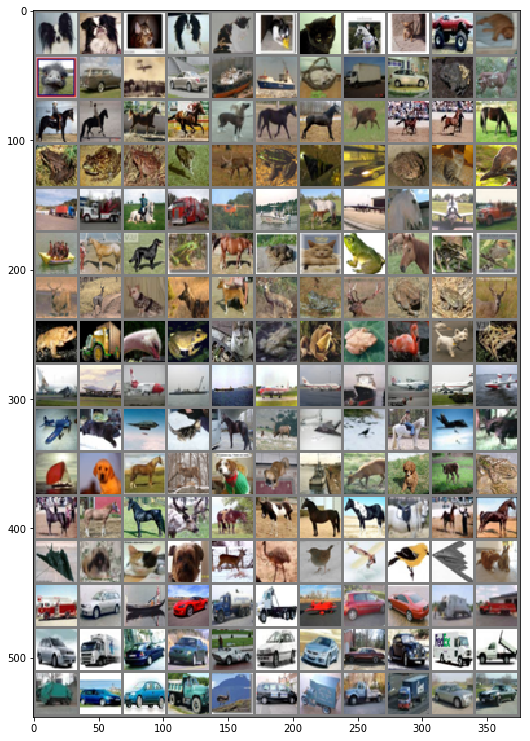

[[ 27.  31.  33.  34.  35.  37.  37.  37.  38.  38.]
 [ 31.  31.  33.  33.  33.  33.  34.  35.  35.  35.]
 [ 19.  20.  23.  23.  24.  25.  25.  25.  25.  25.]
 [ 15.  18.  18.  18.  18.  19.  20.  20.  20.  20.]
 [ 24.  25.  25.  27.  27.  27.  28.  28.  28.  28.]
 [ 26.  26.  27.  27.  28.  28.  28.  28.  28.  29.]
 [ 16.  16.  17.  18.  19.  20.  20.  21.  21.  22.]
 [ 22.  22.  23.  23.  24.  24.  24.  24.  25.  25.]
 [ 11.  11.  12.  12.  12.  12.  13.  14.  14.  14.]
 [ 29.  32.  32.  33.  33.  33.  33.  34.  34.  34.]
 [ 20.  21.  24.  24.  24.  26.  27.  27.  27.  28.]
 [ 32.  32.  32.  33.  33.  34.  34.  34.  34.  34.]
 [ 26.  26.  27.  27.  28.  28.  28.  28.  28.  29.]
 [ 16.  20.  21.  22.  24.  25.  26.  27.  27.  27.]
 [ 29.  30.  32.  33.  33.  34.  34.  35.  35.  35.]
 [ 20.  22.  23.  23.  24.  24.  26.  26.  27.  27.]]
Train Epoch: 4 [0/50000 (0%)]	Loss: 1.823725
Train Epoch: 4 [6400/50000 (13%)]	Loss: 1.321536
Train Epoch: 4 [12800/50000 (26%)]	Loss: 1.846194
Train E

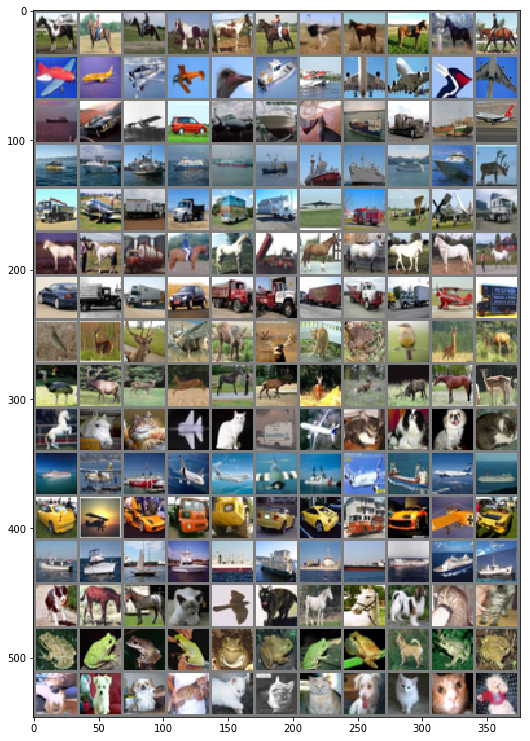

[[ 21.  25.  26.  26.  27.  27.  27.  29.  29.  29.]
 [ 35.  45.  45.  46.  47.  47.  48.  49.  49.  49.]
 [ 23.  24.  24.  24.  26.  26.  26.  27.  27.  27.]
 [ 17.  17.  18.  18.  18.  18.  18.  19.  19.  20.]
 [ 20.  22.  22.  23.  24.  25.  26.  26.  27.  28.]
 [ 31.  32.  34.  36.  36.  36.  36.  37.  37.  37.]
 [ 30.  31.  34.  35.  36.  37.  38.  38.  38.  38.]
 [ 13.  14.  18.  21.  21.  24.  25.  25.  26.  27.]
 [ 21.  23.  24.  24.  25.  25.  26.  26.  28.  28.]
 [ 32.  36.  36.  36.  37.  37.  37.  37.  38.  38.]
 [ 21.  25.  26.  26.  26.  27.  28.  28.  28.  29.]
 [ 30.  31.  31.  33.  35.  35.  35.  35.  36.  36.]
 [ 17.  23.  23.  25.  25.  25.  26.  27.  27.  27.]
 [ 41.  43.  44.  44.  44.  45.  45.  45.  46.  46.]
 [ 22.  23.  23.  25.  25.  27.  27.  27.  28.  29.]
 [ 30.  35.  35.  37.  37.  37.  38.  38.  39.  39.]]
Train Epoch: 5 [0/50000 (0%)]	Loss: 0.766646
Train Epoch: 5 [6400/50000 (13%)]	Loss: 1.172294
Train Epoch: 5 [12800/50000 (26%)]	Loss: 1.126556
Train E

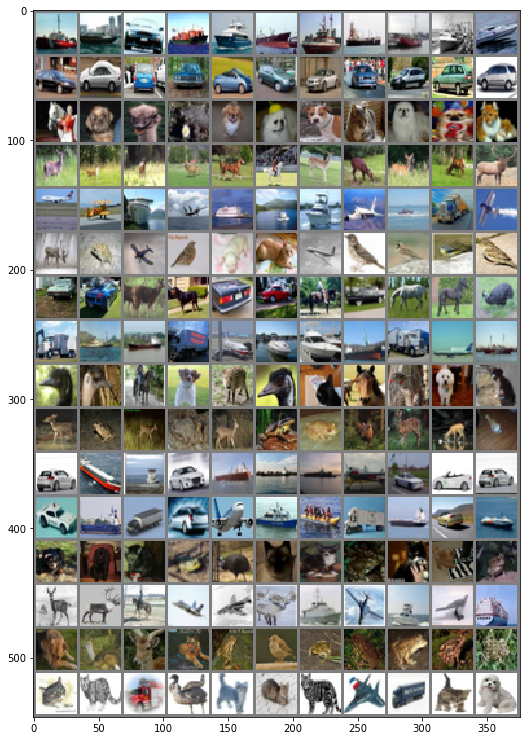

[[ 18.  18.  18.  21.  21.  21.  21.  22.  22.  22.]
 [ 24.  25.  25.  26.  28.  28.  28.  30.  31.  31.]
 [ 27.  28.  32.  33.  33.  34.  35.  35.  36.  36.]
 [ 20.  24.  25.  25.  26.  26.  28.  28.  29.  29.]
 [ 21.  25.  25.  25.  25.  26.  26.  26.  27.  27.]
 [ 35.  37.  38.  38.  39.  41.  41.  42.  42.  42.]
 [ 35.  35.  37.  37.  37.  39.  39.  39.  40.  40.]
 [ 20.  20.  21.  21.  22.  22.  24.  24.  24.  24.]
 [ 33.  33.  33.  35.  36.  36.  36.  37.  38.  38.]
 [ 14.  14.  16.  18.  20.  22.  22.  22.  22.  22.]
 [ 19.  20.  22.  23.  25.  25.  25.  25.  26.  26.]
 [ 25.  25.  25.  27.  27.  27.  28.  28.  28.  29.]
 [ 25.  26.  27.  28.  28.  29.  29.  29.  30.  30.]
 [ 25.  28.  28.  29.  30.  31.  32.  32.  33.  33.]
 [ 15.  19.  20.  20.  20.  20.  20.  21.  22.  22.]
 [ 22.  29.  30.  30.  30.  31.  32.  35.  35.  35.]]
Train Epoch: 6 [0/50000 (0%)]	Loss: 1.195005
Train Epoch: 6 [6400/50000 (13%)]	Loss: 0.920307
Train Epoch: 6 [12800/50000 (26%)]	Loss: 0.857725
Train E

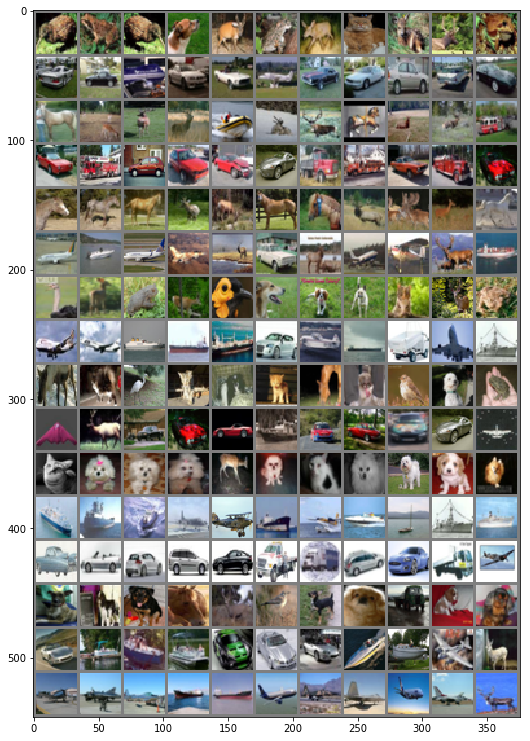

[[ 24.  27.  30.  31.  32.  34.  34.  35.  35.  36.]
 [ 32.  35.  35.  36.  37.  37.  37.  39.  40.  40.]
 [ 39.  40.  40.  41.  41.  41.  41.  41.  42.  43.]
 [ 29.  31.  34.  35.  35.  36.  37.  37.  37.  38.]
 [ 27.  30.  30.  30.  31.  32.  32.  32.  33.  33.]
 [ 33.  34.  35.  37.  38.  38.  39.  41.  41.  41.]
 [ 37.  38.  39.  39.  39.  40.  41.  41.  41.  41.]
 [ 20.  22.  23.  24.  25.  26.  26.  26.  27.  27.]
 [ 27.  29.  30.  31.  33.  35.  36.  36.  36.  36.]
 [ 33.  33.  33.  33.  36.  37.  37.  38.  38.  39.]
 [ 21.  22.  22.  24.  25.  29.  29.  29.  30.  31.]
 [ 21.  23.  23.  24.  24.  24.  25.  25.  26.  26.]
 [ 27.  32.  33.  34.  34.  35.  35.  35.  35.  35.]
 [ 26.  30.  31.  32.  32.  32.  32.  33.  33.  33.]
 [ 36.  38.  40.  40.  41.  43.  43.  44.  45.  45.]
 [ 20.  21.  23.  26.  26.  26.  27.  27.  28.  28.]]
Train Epoch: 7 [0/50000 (0%)]	Loss: 1.005265
Train Epoch: 7 [6400/50000 (13%)]	Loss: 1.125523
Train Epoch: 7 [12800/50000 (26%)]	Loss: 1.822700
Train E

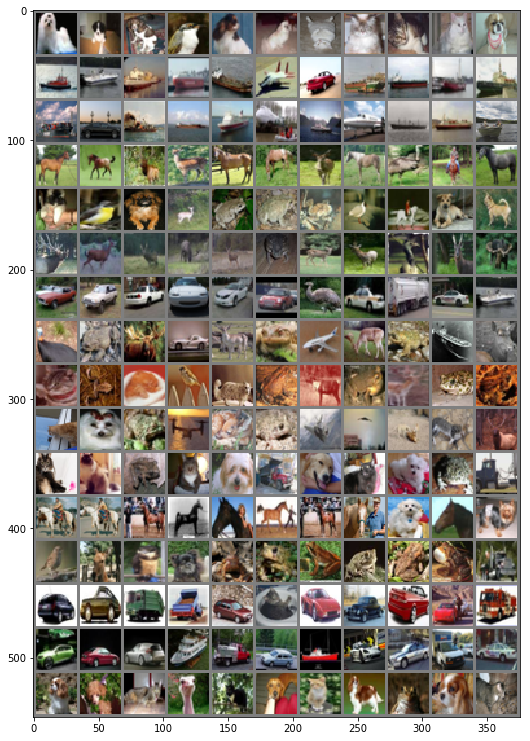

[[ 30.  33.  35.  35.  35.  36.  36.  36.  36.  37.]
 [ 36.  37.  38.  39.  40.  40.  41.  41.  42.  42.]
 [ 24.  26.  27.  28.  28.  29.  30.  31.  32.  32.]
 [ 27.  28.  29.  29.  30.  30.  30.  30.  31.  31.]
 [ 30.  34.  35.  42.  42.  43.  43.  43.  44.  44.]
 [ 32.  34.  34.  35.  37.  39.  39.  40.  41.  42.]
 [ 29.  30.  32.  32.  33.  35.  35.  35.  37.  37.]
 [ 42.  42.  44.  44.  45.  46.  46.  47.  47.  47.]
 [ 33.  33.  34.  34.  34.  36.  36.  36.  36.  37.]
 [ 47.  48.  50.  50.  50.  51.  52.  52.  53.  53.]
 [ 30.  43.  44.  46.  48.  48.  49.  49.  50.  50.]
 [ 25.  32.  33.  34.  35.  36.  37.  38.  39.  40.]
 [ 36.  36.  36.  37.  38.  38.  39.  40.  40.  40.]
 [ 31.  32.  32.  35.  35.  36.  37.  37.  38.  38.]
 [ 34.  34.  36.  36.  36.  36.  39.  39.  40.  40.]
 [ 32.  33.  38.  41.  42.  42.  42.  42.  42.  42.]]
Train Epoch: 8 [0/50000 (0%)]	Loss: 0.804958
Train Epoch: 8 [6400/50000 (13%)]	Loss: 0.871769
Train Epoch: 8 [12800/50000 (26%)]	Loss: 0.778104
Train E

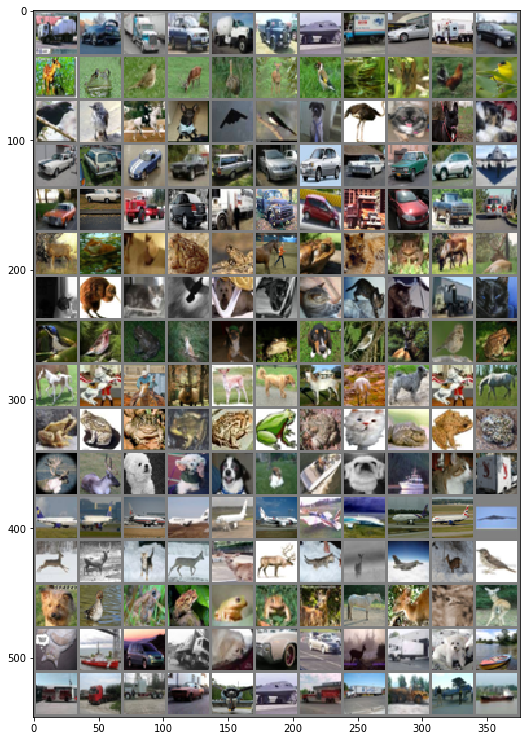

[[ 37.  38.  40.  40.  40.  41.  41.  42.  42.  42.]
 [ 24.  25.  26.  26.  27.  28.  28.  29.  29.  29.]
 [ 48.  48.  49.  49.  50.  51.  51.  51.  51.  51.]
 [ 35.  37.  38.  38.  39.  43.  43.  44.  44.  44.]
 [ 34.  38.  39.  41.  42.  42.  42.  43.  43.  44.]
 [ 36.  41.  43.  43.  44.  45.  45.  46.  46.  46.]
 [ 45.  46.  48.  49.  50.  50.  50.  51.  52.  53.]
 [ 21.  28.  30.  31.  31.  31.  32.  32.  32.  32.]
 [ 44.  44.  45.  45.  46.  46.  46.  46.  46.  47.]
 [ 42.  44.  47.  47.  48.  52.  52.  52.  52.  53.]
 [ 35.  39.  40.  40.  44.  47.  47.  48.  49.  49.]
 [ 22.  22.  24.  26.  27.  31.  33.  33.  33.  33.]
 [ 36.  42.  44.  45.  45.  45.  45.  45.  46.  46.]
 [ 38.  39.  39.  39.  39.  40.  40.  40.  40.  41.]
 [ 39.  40.  44.  44.  45.  46.  46.  46.  46.  46.]
 [ 24.  24.  28.  29.  30.  30.  31.  32.  33.  33.]]
Train Epoch: 9 [0/50000 (0%)]	Loss: 0.858666
Train Epoch: 9 [6400/50000 (13%)]	Loss: 0.721240
Train Epoch: 9 [12800/50000 (26%)]	Loss: 0.469766
Train E

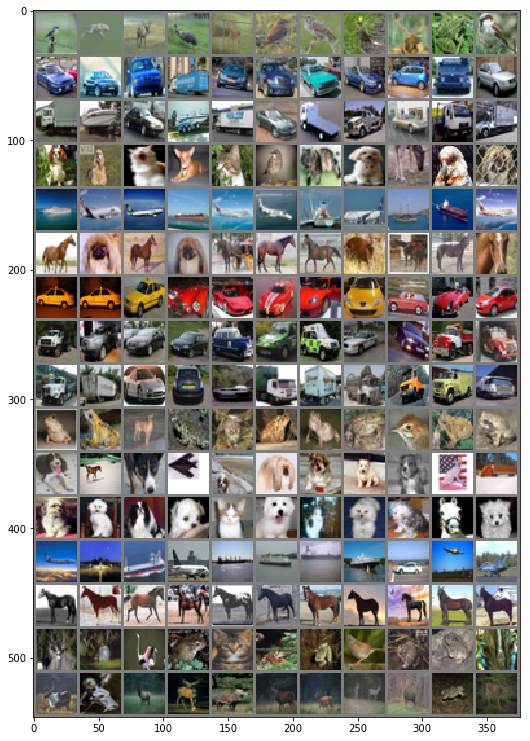

[[ 30.  33.  36.  36.  36.  38.  39.  40.  40.  40.]
 [ 20.  23.  23.  23.  24.  24.  25.  26.  26.  26.]
 [ 24.  26.  29.  29.  29.  30.  30.  30.  30.  31.]
 [ 33.  36.  37.  39.  40.  40.  40.  42.  42.  43.]
 [ 24.  30.  31.  31.  31.  32.  33.  34.  34.  35.]
 [ 27.  28.  29.  29.  29.  30.  30.  30.  31.  32.]
 [  7.  31.  32.  33.  34.  35.  35.  36.  38.  40.]
 [ 39.  40.  42.  44.  44.  44.  44.  45.  45.  45.]
 [ 35.  35.  38.  39.  39.  39.  42.  42.  42.  43.]
 [ 29.  35.  38.  39.  39.  39.  40.  41.  41.  42.]
 [ 47.  49.  49.  51.  51.  52.  52.  52.  52.  52.]
 [ 30.  33.  37.  37.  39.  40.  40.  40.  40.  42.]
 [ 22.  27.  27.  28.  31.  31.  32.  32.  33.  33.]
 [ 22.  26.  27.  27.  28.  29.  29.  32.  33.  33.]
 [ 33.  34.  36.  39.  39.  40.  41.  41.  41.  41.]
 [ 41.  44.  46.  46.  48.  48.  49.  49.  49.  49.]]
Train Epoch: 10 [0/50000 (0%)]	Loss: 0.982084
Train Epoch: 10 [6400/50000 (13%)]	Loss: 0.864704
Train Epoch: 10 [12800/50000 (26%)]	Loss: 1.013452
Trai

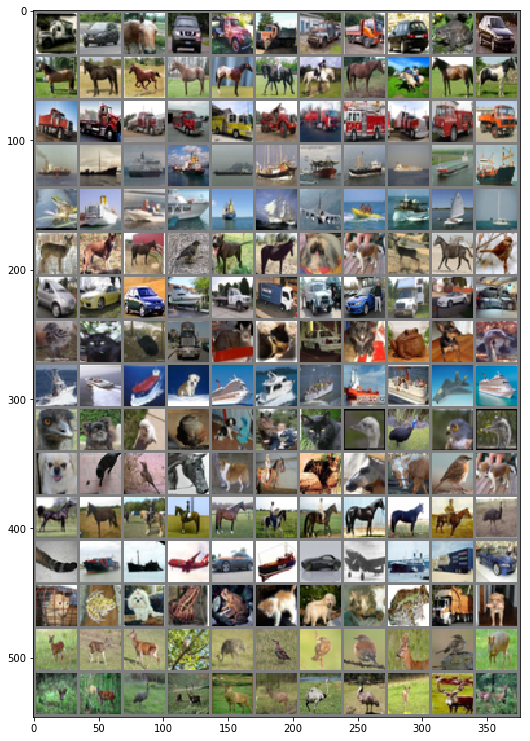

[[ 39.  44.  46.  46.  47.  48.  48.  48.  48.  49.]
 [ 19.  25.  26.  26.  27.  28.  28.  29.  30.  31.]
 [ 32.  33.  37.  37.  38.  38.  38.  39.  39.  40.]
 [ 29.  30.  32.  33.  33.  34.  34.  36.  36.  38.]
 [ 39.  44.  45.  46.  47.  47.  47.  48.  48.  48.]
 [ 37.  37.  37.  37.  38.  39.  40.  41.  41.  42.]
 [ 38.  38.  38.  41.  42.  43.  44.  45.  45.  46.]
 [ 43.  45.  46.  46.  46.  47.  48.  49.  49.  49.]
 [ 57.  58.  59.  60.  60.  61.  62.  63.  64.  65.]
 [ 42.  46.  47.  47.  47.  47.  48.  50.  50.  51.]
 [ 36.  38.  39.  41.  43.  43.  45.  45.  46.  46.]
 [ 34.  35.  37.  38.  38.  39.  39.  40.  40.  40.]
 [ 32.  33.  36.  38.  39.  39.  40.  41.  41.  42.]
 [ 41.  44.  44.  45.  47.  48.  49.  50.  51.  51.]
 [ 26.  28.  29.  29.  31.  31.  31.  31.  31.  32.]
 [ 28.  28.  32.  32.  33.  34.  34.  34.  34.  34.]]
Train Epoch: 11 [0/50000 (0%)]	Loss: 0.681465
Train Epoch: 11 [6400/50000 (13%)]	Loss: 1.026561
Train Epoch: 11 [12800/50000 (26%)]	Loss: 0.903735
Trai

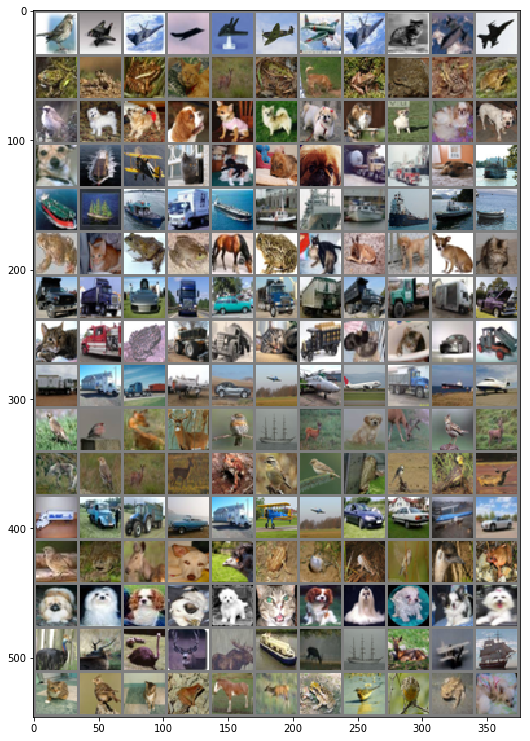

[[ 50.  51.  54.  55.  55.  56.  56.  57.  57.  58.]
 [ 25.  28.  28.  28.  30.  31.  31.  34.  35.  35.]
 [ 36.  37.  37.  38.  38.  39.  39.  39.  40.  40.]
 [ 45.  47.  47.  48.  48.  49.  51.  52.  53.  54.]
 [ 46.  47.  48.  50.  51.  51.  51.  51.  52.  53.]
 [ 41.  43.  44.  44.  44.  45.  45.  45.  46.  48.]
 [ 27.  28.  29.  31.  32.  33.  34.  34.  35.  35.]
 [ 42.  42.  43.  43.  44.  44.  46.  47.  50.  50.]
 [ 20.  24.  24.  24.  25.  25.  25.  26.  27.  28.]
 [ 39.  39.  42.  43.  44.  44.  44.  44.  45.  45.]
 [ 28.  32.  33.  33.  34.  35.  36.  37.  37.  38.]
 [ 31.  33.  33.  33.  33.  34.  34.  34.  34.  34.]
 [ 36.  40.  40.  42.  43.  43.  44.  44.  45.  45.]
 [ 24.  31.  32.  33.  33.  35.  35.  37.  37.  37.]
 [ 40.  44.  49.  49.  50.  52.  52.  53.  53.  53.]
 [ 41.  43.  43.  45.  45.  46.  46.  47.  47.  47.]]
Train Epoch: 12 [0/50000 (0%)]	Loss: 0.982228
Train Epoch: 12 [6400/50000 (13%)]	Loss: 0.735023
Train Epoch: 12 [12800/50000 (26%)]	Loss: 1.086303
Trai

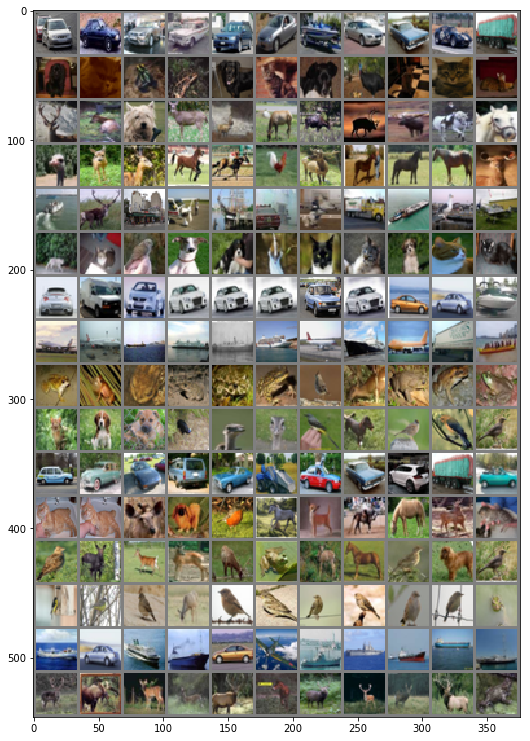

[[ 27.  28.  28.  31.  31.  32.  32.  32.  33.  33.]
 [ 30.  32.  33.  33.  34.  35.  36.  36.  36.  37.]
 [ 44.  45.  46.  48.  48.  50.  50.  51.  52.  52.]
 [ 31.  35.  36.  38.  39.  40.  41.  41.  42.  42.]
 [ 36.  39.  40.  41.  42.  42.  42.  42.  43.  43.]
 [ 38.  42.  46.  49.  49.  49.  49.  49.  49.  50.]
 [ 30.  30.  33.  35.  35.  36.  37.  38.  39.  40.]
 [ 15.  16.  18.  19.  24.  24.  25.  25.  25.  25.]
 [ 29.  31.  34.  34.  35.  35.  36.  37.  37.  37.]
 [ 33.  36.  40.  41.  42.  43.  43.  43.  43.  44.]
 [ 26.  28.  31.  31.  32.  33.  34.  37.  37.  37.]
 [ 35.  45.  45.  45.  46.  47.  47.  47.  49.  49.]
 [ 28.  29.  33.  37.  37.  37.  37.  38.  38.  39.]
 [ 31.  33.  36.  36.  37.  37.  37.  37.  39.  39.]
 [ 27.  28.  30.  31.  31.  31.  32.  32.  32.  33.]
 [ 34.  35.  35.  36.  37.  38.  38.  38.  38.  39.]]
Train Epoch: 13 [0/50000 (0%)]	Loss: 0.565584
Train Epoch: 13 [6400/50000 (13%)]	Loss: 1.146189
Train Epoch: 13 [12800/50000 (26%)]	Loss: 0.841288
Trai

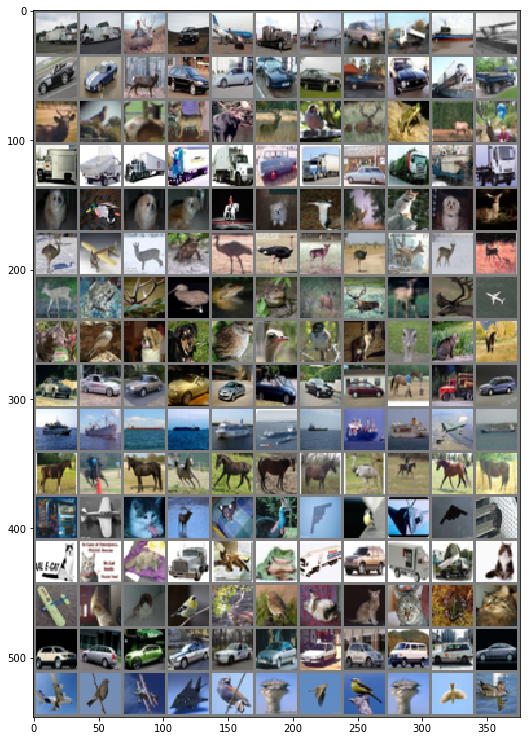

[[ 30.  33.  36.  36.  37.  37.  38.  40.  40.  40.]
 [ 47.  48.  50.  51.  52.  52.  52.  53.  54.  54.]
 [ 42.  45.  45.  47.  47.  47.  47.  48.  48.  49.]
 [ 38.  40.  41.  42.  44.  45.  47.  47.  47.  48.]
 [ 36.  40.  42.  43.  44.  45.  45.  45.  46.  46.]
 [ 56.  58.  58.  59.  59.  60.  60.  61.  61.  61.]
 [ 41.  42.  42.  44.  46.  47.  47.  47.  48.  48.]
 [ 41.  43.  43.  44.  44.  45.  47.  47.  48.  48.]
 [ 34.  38.  40.  42.  42.  42.  43.  43.  44.  44.]
 [ 19.  24.  27.  27.  29.  29.  30.  30.  31.  32.]
 [ 26.  26.  28.  28.  28.  29.  29.  29.  30.  30.]
 [ 46.  52.  52.  53.  54.  55.  55.  55.  55.  57.]
 [ 43.  46.  46.  47.  47.  48.  48.  48.  50.  50.]
 [ 52.  55.  56.  56.  56.  58.  58.  59.  60.  61.]
 [ 35.  37.  38.  44.  47.  48.  49.  52.  52.  53.]
 [ 53.  54.  54.  54.  55.  55.  55.  56.  56.  56.]]
Train Epoch: 14 [0/50000 (0%)]	Loss: 0.375083
Train Epoch: 14 [6400/50000 (13%)]	Loss: 1.052961
Train Epoch: 14 [12800/50000 (26%)]	Loss: 0.631949
Trai

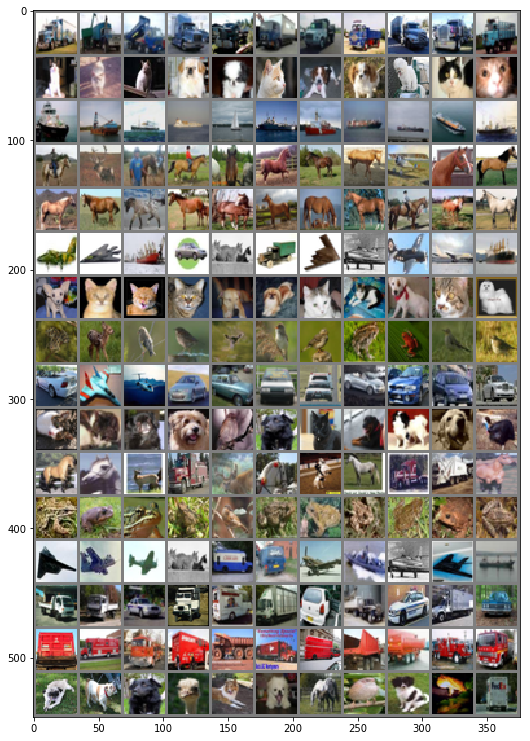

[[ 30.  34.  41.  43.  45.  45.  46.  47.  47.  47.]
 [ 35.  37.  38.  39.  39.  39.  39.  40.  40.  40.]
 [ 32.  33.  33.  33.  34.  34.  34.  34.  35.  35.]
 [ 35.  36.  38.  39.  40.  40.  41.  41.  41.  41.]
 [ 39.  41.  42.  43.  44.  46.  46.  47.  47.  47.]
 [ 41.  41.  43.  46.  48.  49.  50.  51.  51.  51.]
 [ 43.  44.  45.  45.  45.  47.  47.  47.  47.  48.]
 [ 24.  33.  35.  35.  36.  36.  37.  37.  37.  38.]
 [ 35.  35.  38.  39.  39.  39.  39.  40.  41.  41.]
 [ 44.  46.  46.  50.  50.  52.  53.  53.  54.  55.]
 [ 40.  45.  48.  50.  50.  50.  50.  51.  52.  52.]
 [ 40.  44.  45.  45.  45.  46.  46.  47.  47.  47.]
 [ 56.  59.  61.  63.  63.  63.  64.  65.  65.  65.]
 [ 55.  55.  57.  58.  58.  58.  58.  59.  59.  59.]
 [ 37.  42.  42.  45.  46.  47.  48.  49.  49.  49.]
 [ 52.  53.  54.  56.  56.  56.  57.  58.  58.  59.]]
Train Epoch: 15 [0/50000 (0%)]	Loss: 0.709027
Train Epoch: 15 [6400/50000 (13%)]	Loss: 0.277042
Train Epoch: 15 [12800/50000 (26%)]	Loss: 0.491651
Trai

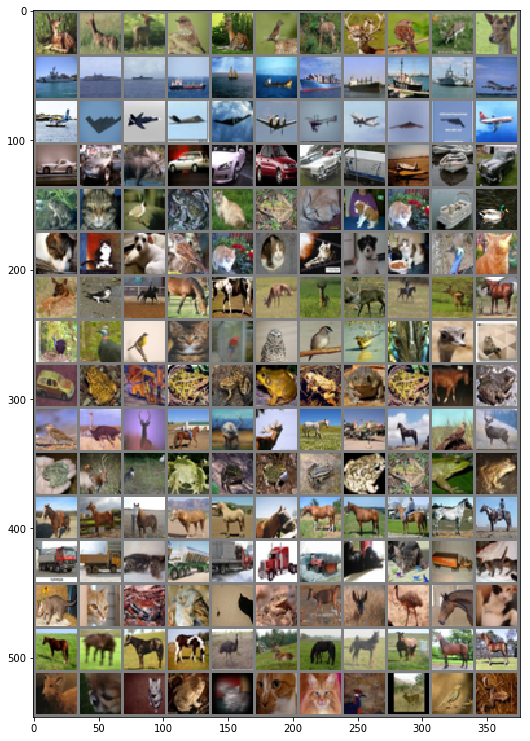

[[ 28.  32.  33.  33.  36.  37.  37.  37.  37.  38.]
 [ 17.  22.  24.  25.  25.  26.  26.  26.  27.  27.]
 [ 37.  38.  38.  38.  39.  39.  39.  40.  40.  40.]
 [ 38.  41.  42.  43.  46.  47.  48.  49.  49.  50.]
 [ 46.  46.  53.  54.  55.  55.  56.  56.  56.  56.]
 [ 51.  52.  55.  56.  56.  56.  58.  58.  58.  59.]
 [ 37.  38.  39.  39.  40.  41.  42.  42.  43.  43.]
 [ 43.  45.  47.  49.  49.  51.  51.  51.  51.  53.]
 [ 36.  40.  41.  42.  42.  42.  42.  42.  43.  44.]
 [ 35.  35.  36.  37.  41.  41.  41.  41.  42.  43.]
 [ 51.  52.  53.  54.  54.  54.  55.  55.  55.  56.]
 [ 34.  35.  35.  38.  38.  39.  40.  41.  41.  41.]
 [ 47.  53.  54.  55.  55.  55.  56.  56.  56.  57.]
 [ 41.  44.  44.  44.  47.  47.  47.  48.  49.  49.]
 [ 26.  28.  30.  30.  30.  30.  31.  31.  32.  34.]
 [ 36.  44.  46.  48.  49.  49.  49.  49.  49.  50.]]
Train Epoch: 16 [0/50000 (0%)]	Loss: 0.568001
Train Epoch: 16 [6400/50000 (13%)]	Loss: 0.686585
Train Epoch: 16 [12800/50000 (26%)]	Loss: 0.656080
Trai

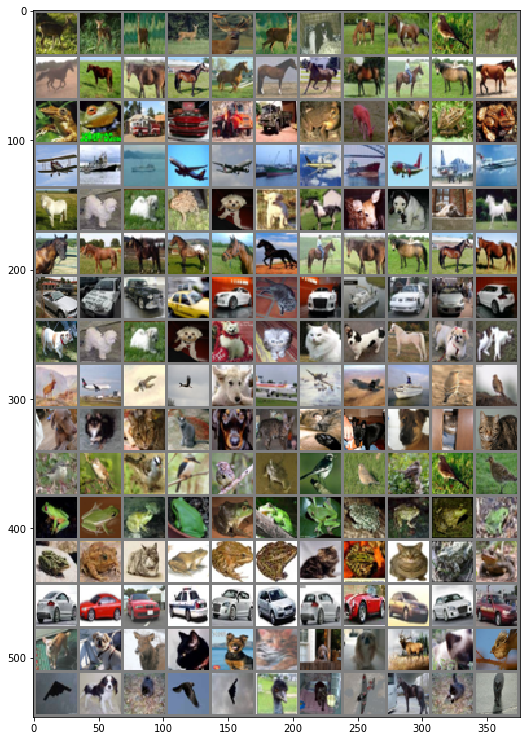

[[ 25.  32.  33.  35.  35.  35.  36.  37.  38.  38.]
 [ 41.  44.  44.  44.  46.  46.  47.  47.  48.  48.]
 [ 44.  48.  48.  48.  49.  50.  50.  50.  51.  51.]
 [ 34.  41.  42.  42.  43.  43.  45.  45.  45.  45.]
 [ 34.  39.  42.  46.  46.  49.  52.  52.  53.  53.]
 [ 32.  32.  37.  38.  40.  40.  41.  41.  41.  42.]
 [ 50.  50.  50.  51.  52.  53.  54.  55.  55.  55.]
 [ 29.  34.  47.  47.  49.  49.  50.  50.  51.  52.]
 [ 61.  62.  63.  65.  67.  68.  68.  69.  69.  70.]
 [ 47.  48.  49.  49.  50.  51.  52.  52.  53.  54.]
 [ 33.  36.  36.  37.  37.  40.  41.  41.  41.  41.]
 [ 37.  43.  43.  43.  45.  46.  47.  47.  47.  49.]
 [ 40.  42.  45.  45.  46.  46.  46.  47.  47.  48.]
 [ 35.  36.  36.  38.  41.  41.  41.  41.  42.  42.]
 [ 45.  45.  46.  48.  48.  52.  53.  53.  53.  54.]
 [ 49.  52.  55.  56.  56.  57.  57.  57.  58.  58.]]
Train Epoch: 17 [0/50000 (0%)]	Loss: 0.602692
Train Epoch: 17 [6400/50000 (13%)]	Loss: 0.467539
Train Epoch: 17 [12800/50000 (26%)]	Loss: 0.572540
Trai

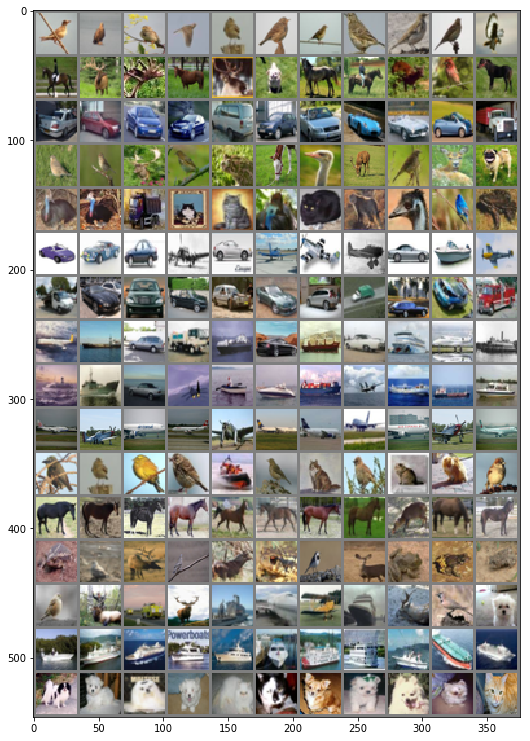

[[ 39.  44.  45.  47.  47.  51.  54.  54.  56.  57.]
 [ 34.  35.  38.  39.  39.  39.  40.  41.  41.  42.]
 [ 49.  50.  50.  51.  51.  52.  52.  52.  52.  52.]
 [ 19.  21.  22.  24.  24.  24.  25.  25.  26.  27.]
 [ 34.  38.  42.  43.  44.  44.  45.  45.  46.  46.]
 [ 34.  34.  36.  39.  39.  41.  42.  43.  43.  43.]
 [ 43.  44.  46.  46.  46.  46.  46.  47.  48.  48.]
 [ 29.  29.  30.  30.  31.  31.  32.  33.  33.  33.]
 [ 30.  31.  31.  33.  33.  33.  34.  34.  35.  35.]
 [ 23.  25.  27.  29.  31.  31.  33.  34.  34.  35.]
 [ 44.  46.  46.  47.  48.  48.  48.  48.  48.  49.]
 [ 36.  37.  40.  41.  41.  42.  43.  43.  43.  44.]
 [ 42.  42.  43.  44.  46.  46.  46.  47.  47.  48.]
 [ 38.  45.  47.  48.  49.  49.  51.  51.  51.  51.]
 [ 34.  42.  43.  45.  47.  47.  49.  49.  50.  51.]
 [ 48.  49.  50.  51.  51.  52.  52.  53.  54.  54.]]
Train Epoch: 18 [0/50000 (0%)]	Loss: 0.659360
Train Epoch: 18 [6400/50000 (13%)]	Loss: 0.939940
Train Epoch: 18 [12800/50000 (26%)]	Loss: 0.432366
Trai

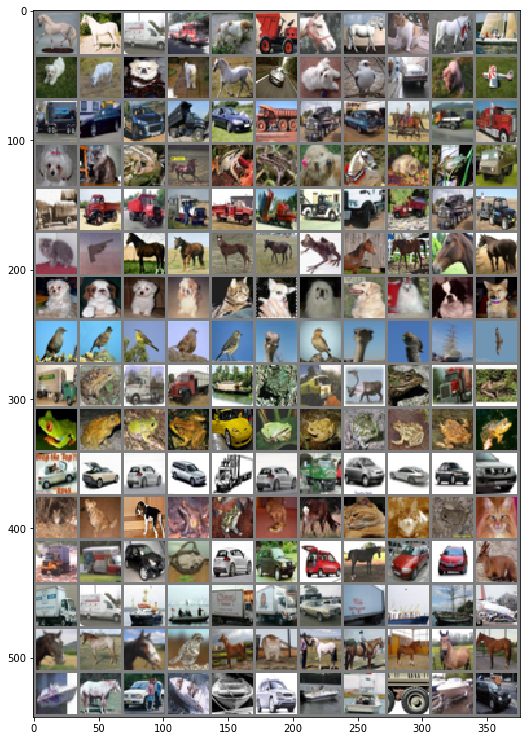

[[ 57.  58.  58.  59.  59.  60.  60.  61.  61.  61.]
 [ 39.  42.  45.  47.  47.  47.  49.  50.  51.  51.]
 [ 39.  43.  44.  45.  45.  46.  46.  46.  46.  47.]
 [ 42.  45.  48.  48.  48.  48.  50.  51.  52.  52.]
 [ 43.  44.  45.  45.  46.  47.  47.  48.  48.  49.]
 [ 44.  45.  47.  48.  49.  51.  51.  51.  52.  53.]
 [ 28.  30.  32.  35.  35.  36.  38.  38.  39.  40.]
 [ 27.  34.  38.  40.  43.  43.  45.  48.  49.  49.]
 [ 43.  45.  47.  48.  48.  48.  49.  49.  49.  49.]
 [ 39.  46.  47.  47.  49.  50.  51.  52.  52.  54.]
 [ 37.  37.  39.  46.  46.  47.  48.  48.  49.  49.]
 [ 40.  41.  43.  43.  44.  44.  44.  45.  45.  45.]
 [ 38.  43.  46.  48.  49.  49.  50.  50.  51.  51.]
 [ 40.  41.  42.  43.  44.  45.  46.  46.  46.  47.]
 [ 39.  43.  45.  45.  46.  47.  48.  48.  48.  48.]
 [ 57.  58.  59.  59.  61.  61.  62.  62.  62.  62.]]
Train Epoch: 19 [0/50000 (0%)]	Loss: 0.187165
Train Epoch: 19 [6400/50000 (13%)]	Loss: 0.422167
Train Epoch: 19 [12800/50000 (26%)]	Loss: 0.742370
Trai

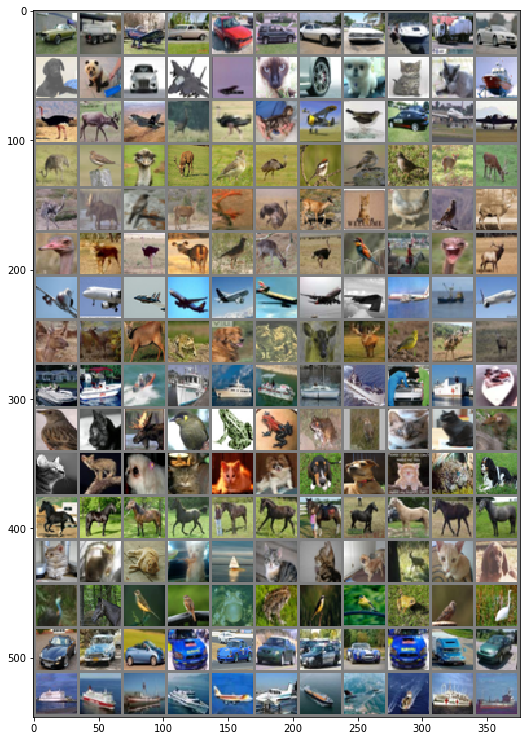

[[ 28.  33.  33.  34.  36.  36.  38.  38.  38.  40.]
 [ 60.  65.  67.  67.  68.  68.  68.  68.  69.  70.]
 [ 43.  48.  53.  54.  55.  55.  56.  58.  58.  58.]
 [ 18.  27.  28.  28.  34.  35.  35.  35.  36.  36.]
 [ 49.  52.  52.  55.  55.  56.  56.  56.  56.  57.]
 [ 34.  36.  37.  38.  39.  40.  42.  42.  42.  42.]
 [ 34.  39.  39.  41.  41.  41.  42.  42.  42.  43.]
 [ 35.  39.  40.  41.  41.  42.  42.  43.  43.  44.]
 [ 50.  56.  58.  58.  59.  59.  61.  62.  62.  62.]
 [ 55.  56.  56.  62.  63.  63.  65.  65.  66.  66.]
 [ 61.  63.  63.  63.  63.  64.  64.  64.  64.  65.]
 [ 29.  31.  33.  35.  37.  38.  38.  39.  39.  39.]
 [ 52.  55.  57.  59.  59.  60.  60.  61.  61.  62.]
 [ 48.  49.  51.  52.  52.  56.  56.  57.  57.  57.]
 [ 33.  33.  40.  40.  41.  42.  42.  43.  44.  44.]
 [ 35.  35.  39.  39.  40.  40.  41.  42.  42.  42.]]
Train Epoch: 20 [0/50000 (0%)]	Loss: 0.364400
Train Epoch: 20 [6400/50000 (13%)]	Loss: 0.697263
Train Epoch: 20 [12800/50000 (26%)]	Loss: 0.314198
Trai

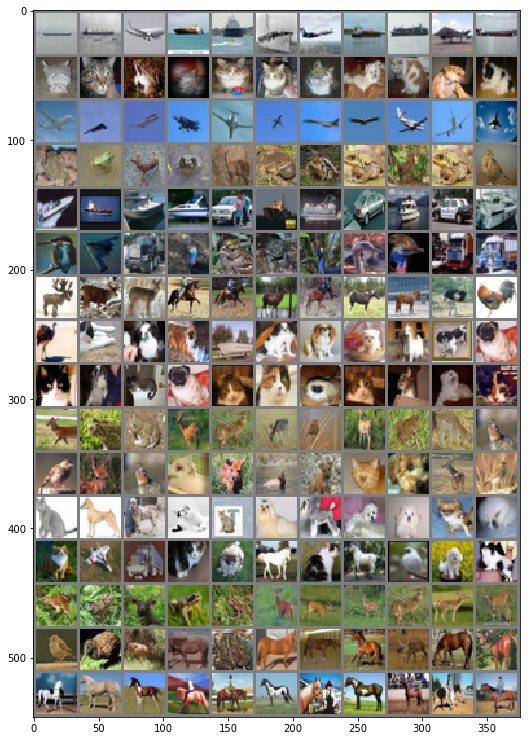

[[ 28.  32.  39.  40.  41.  41.  42.  44.  44.  45.]
 [ 35.  37.  39.  40.  43.  43.  44.  44.  45.  45.]
 [ 27.  29.  29.  32.  32.  33.  34.  34.  34.  35.]
 [ 46.  50.  50.  51.  51.  51.  51.  51.  52.  52.]
 [ 59.  59.  61.  62.  63.  65.  65.  66.  66.  66.]
 [ 61.  62.  64.  65.  66.  66.  67.  68.  68.  68.]
 [ 59.  61.  61.  61.  62.  63.  63.  63.  64.  64.]
 [ 54.  57.  61.  62.  62.  62.  63.  64.  64.  64.]
 [ 44.  47.  49.  50.  51.  52.  53.  54.  55.  56.]
 [ 46.  47.  48.  48.  48.  49.  49.  49.  50.  50.]
 [ 49.  51.  53.  53.  53.  54.  54.  54.  55.  55.]
 [ 49.  49.  50.  53.  54.  57.  58.  59.  60.  60.]
 [ 50.  50.  53.  54.  55.  55.  56.  56.  57.  58.]
 [ 21.  28.  29.  29.  32.  34.  34.  35.  35.  35.]
 [ 38.  40.  41.  42.  44.  44.  44.  44.  45.  45.]
 [ 37.  38.  41.  41.  42.  43.  43.  43.  45.  46.]]


In [68]:
nearest_neighbours_plot()

for epoch in range(1, epochs + 1):
    train(epoch)
    test(epoch)
    nearest_neighbours_plot()